## Project Title: RealWaste Classification using Convolution Neural Networks
### Student ID: 22052310
The main objective of project was to build 3 different sets of custom Convolutional Neural networks with different number of layers and research on how different type of hyperparameters affects the performance of models in term of real waste classification accuracy. The best custom model was compared with state of art pre-trained model MobileNetV3 and EfficientV2.


In [1]:
# Load python modules
# Modules from Tensorflow Keras
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.layers import Resizing, Rescaling
from tensorflow.keras.callbacks import ModelCheckpoint
import tensorflow as tf

#Module from Seaborn, sklearn and Matplotlib.pyplot for data visualisation
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

#Module to shuffle the image and label data
from sklearn.utils import shuffle 

# datetime to record the training and prediction time
from datetime import datetime

# Perform iterature with progress bar
from tqdm import tqdm 

# numpy for mathematical operations
import numpy as np
#OpenCV for image processing
import cv2 as cv
#operating system
import os

In [2]:
# Define the class label
waste_class_names = ['Glass', 'Metal', 'Organics', 'Paper', 'Plastic', 'Textile']
waste_class_label = {waste_class_name: i for i, waste_class_name in enumerate(waste_class_names)}
number_of_class = len(waste_class_names)
image_size = (64, 64)

In [3]:
# Check the waste label in integer
waste_class_label

{'Glass': 0, 'Metal': 1, 'Organics': 2, 'Paper': 3, 'Plastic': 4, 'Textile': 5}

In [4]:
resize_layer_32 = tf.keras.Sequential([
    Resizing(32, 32),
])

## Directory path to the Dataset 1 to 3

In [5]:
# Path to Datasets 1 to 3

# Dataset 1 with 4 classes - 270 images for training and 50 images for testing per class
train_ds_1 = 'C:/Mani/Dataset/dataset1/train_ds'
test_ds_1 = 'C:/Mani/Dataset/dataset1/test_ds'

# Dataset 2 with 4 classes - 450 images for training with data augmentation images and 50 images for testing
train_ds_2 = 'C:/Mani/Dataset/dataset2/train_ds'
test_ds_2 = 'C:/Mani/Dataset/dataset2/test_ds'

# Dataset 3 with 6 classes - 450 images for training with data augmentation images and 50 images for testing
train_ds_3 = 'C:/Mani/Dataset/dataset3/train_ds'
test_ds_3 = 'C:/Mani/Dataset/dataset3/test_ds'

## load_waste_data function to load datasets

In [6]:
#Custom function to load real waste image and label

def load_waste_data(train_path, test_path):
    """
    Create the dataset for training and testing
    
    Parameter
    arg1 : path to training waste image folder
    arg1 : path to testing waste image folder
        
    Return:
    test and training dataset with image and label
    
    """
    ds = [train_path, test_path]  
    
    result = []
    
    # Iterate through training and test sets
    for dataset in ds:
        
        #Create empty list for image and label
        waste_images = []
        waste_labels = []
        
        print("Loading waste image {}".format(dataset))
        
        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            waste_label = waste_class_label[folder]
            
            # Iterate through each image in the folder 
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):
                
                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)
                
                #Modified realwaste image with openCV 
                waste_image = cv.imread(img_path)
                # Change from BGR to RGB
                waste_image = cv.cvtColor(waste_image, cv.COLOR_BGR2RGB)
                # Alpha-contrast / beta-brightness
                #waste_image = cv.convertScaleAbs(waste_image, alpha=1.0, beta=1.1) 
                waste_image = cv.resize(waste_image, image_size) 
                
                # Append the realwaste image and its label
                waste_images.append(waste_image)
                waste_labels.append(waste_label)
                
        # change the realwaste image data type to float and label to ingeter.        
        waste_images = np.array(waste_images, dtype = 'float32')
        waste_labels = np.array(waste_labels, dtype = 'int32')   
        
        result.append((waste_images, waste_labels))

    return result

In [7]:
#Prepare dataset for training and testing
(train_images, train_labels), (test_images, test_labels) = load_waste_data(train_ds_3, test_ds_3)

Loading waste image C:/Mani/Dataset/dataset3/train_ds


100%|████████████████████████████████████████████████████████████████████████████████| 450/450 [00:04<00:00, 91.09it/s]


Loading waste image C:/Mani/Dataset/dataset3/test_ds


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 62.79it/s]


In [8]:
#Check the training dataset shape
train_images.shape, test_images.shape

((2700, 64, 64, 3), (300, 64, 64, 3))

In [9]:
# Shuffle both the training and test datasets
np.random.seed(321)
train_images, train_labels = shuffle(train_images, train_labels)
test_images, test_labels = shuffle(test_images, test_labels)

In [10]:
#Check the number of training dataset
print('No of training images:', train_images.shape[0])

No of training images: 2700


In [11]:
#Normalise training and testing images from 0,255 to 0,1
train_images = train_images / 255.0 
test_images = test_images / 255.0

## Display 25 real waste images from 6 classes

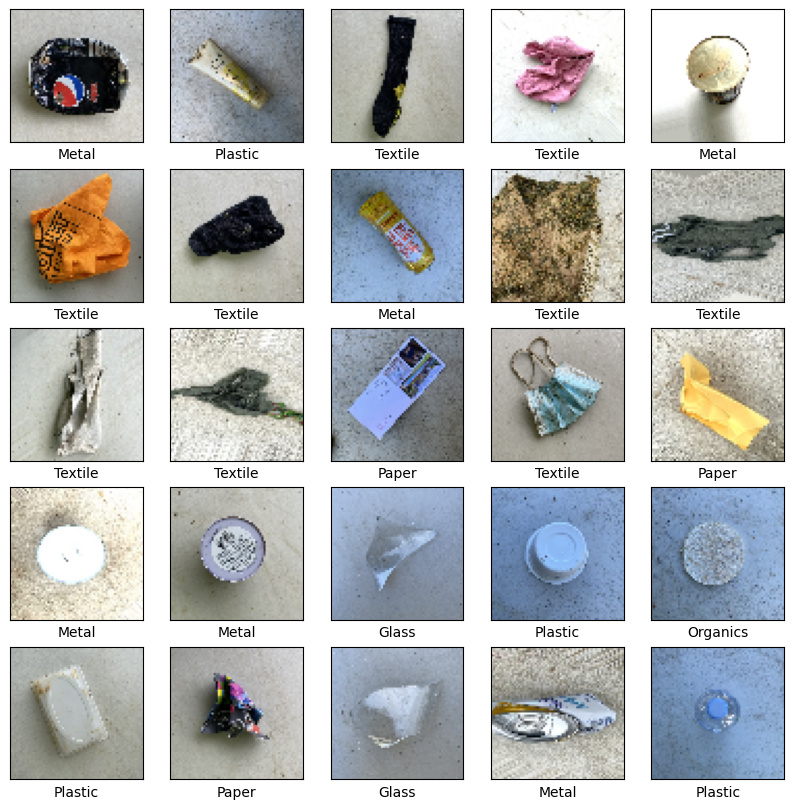

In [12]:
#Display 25 images 
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i])
    plt.xlabel(waste_class_names[train_labels[i]])
plt.show()

## CNN custom Model 1 with 2 Convolution layers

In [13]:
#Sequential Model 1 with 2 Convolutional layers
# Model was built based on tf.keras.layers - with different type of layers as shown below:
#Conv2D, BatchNormalization, Maxpooling, Dropout, Dense, Flatten, resizing

model_1 = tf.keras.models.Sequential([
    tf.keras.layers.Input((None,None,3)),
    resize_layer_32,
        
    # Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.25),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.05), activation = 'relu'),   
    tf.keras.layers.Dense(64, activation = 'relu'), 
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(6, activation='softmax')
       
])

model_1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (None, 32, 32, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 32, 32, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32, 32, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8, 8, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 6)                   │             390 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 552,838 (2.11 MB)

 Trainable params: 552,646 (2.11 MB)

 Non-trainable params: 192 (768.00 B)

## CNN custom Model 2 with 4 Convolution layers

In [14]:
#Sequential Model 2 with 4 Convolutional layers
# Model was built based on tf.keras.layers - with different type of layers as shown below:
#Conv2D, BatchNormalization, Maxpooling, Dropout, Dense, Flatten, resizing


model_2 = tf.keras.models.Sequential([
    tf.keras.layers.Input((64,64,3)),
    
    #Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 3
    tf.keras.layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 4
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.01), activation = 'relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
       
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation = 'relu'),
    tf.keras.layers.Dense(32, activation = 'relu'),
    #tf.keras.layers.BatchNormalization(), 
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(6, activation='softmax')
       
])

model_2.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 8, 8, 64)            │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 4, 4, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │          65,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 32)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 6)                   │             1

 Total params: 235,814 (921.15 KB)

 Trainable params: 235,366 (919.40 KB)

 Non-trainable params: 448 (1.75 KB)

## CNN custom Model 3 with 5 Convolution layers

In [15]:
#Sequential Model 3 with 5 Convolutional layers
# Model was built based on tf.keras.layers - with different type of layers as shown below:
#Conv2D, BatchNormalization, Maxpooling, Dropout, Dense, Flatten, resizing

model_3 = tf.keras.models.Sequential([
    tf.keras.layers.Input((64,64,3)),
    
    # Block 1
    tf.keras.layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 2
    tf.keras.layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 3
    tf.keras.layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(), 
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    # Block 4
    tf.keras.layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    #Block 5
    tf.keras.layers.Conv2D(64, (2,2), padding='same', kernel_regularizer=regularizers.l2(0.05), activation ='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(32, activation ='relu'),
    tf.keras.layers.Dense(16, activation ='relu'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(6, activation='softmax')      
])

model_3.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 64, 64, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 32, 32, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 32, 32, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 16, 16, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 8, 8, 128)           │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 8, 8, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 4, 4, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 4, 4, 64)            │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 2, 2, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 2, 2, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 283,926 (1.08 MB)

 Trainable params: 283,222 (1.08 MB)

 Non-trainable params: 704 (2.75 KB)

## Model checkpoint path for model 1 to 3 to monitor validation accuracy

In [16]:
# Add callbacks to save the model weight with best accuracy during training
#From tensorflow.keras.callbacks import ModelCheckpoint
# Source: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint

checkpoint_filepath6 = 'C:/Mani/ModelCheckpoint/model1_6.keras'
model_checkpoint_callback6 = ModelCheckpoint(
    filepath=checkpoint_filepath6,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

checkpoint_filepath7 = 'C:/Mani/ModelCheckpoint/model2_6.keras'
model_checkpoint_callback7 = ModelCheckpoint(
    filepath=checkpoint_filepath7,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

checkpoint_filepath8 = 'C:/Mani/ModelCheckpoint/model3_6.keras'
model_checkpoint_callback8 = ModelCheckpoint(
    filepath=checkpoint_filepath8,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)

## Compile model 1 to 3 with optimum learning rate.

In [17]:
model_1.compile(optimizer = tf.keras.optimizers.Adam(0.0013),
                loss = 'sparse_categorical_crossentropy', 
                metrics=['accuracy'])


model_2.compile(optimizer = tf.keras.optimizers.Adam(0.001),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])


model_3.compile(optimizer = tf.keras.optimizers.Adam(0.00098),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])
               

## Setup learning rate scheduler

In [18]:
#Learning rate scheduler for Model 3

def scheduler1(epoch, lr):
    if epoch <= 30:
        return lr
    else:
        return lr * 0.95
        
lr_callback1 = LearningRateScheduler(scheduler1, verbose=1)

In [19]:
#Learning rate scheduler for Model 3

def scheduler2(epoch, lr):
    if epoch <= 45:
        return lr
    else:
        return lr * 0.95
        
lr_callback2 = LearningRateScheduler(scheduler1, verbose=1)

## Define the number of epochs and batch size

In [20]:
# Set number of epochs
epochs = 200
batch_size = 64

## Model fitting with validation split 10%

In [21]:
# Model 1 fitting
# Register the model training start time.
start_time = datetime.now()
print('Time model start:', start_time)

history1 = model_1.fit(train_images, train_labels,
                      batch_size=batch_size, epochs=epochs,
                      validation_split = 0.2, verbose=1,
                      callbacks=[lr_callback1, model_checkpoint_callback6])

# Register the model training end time.
end_time = datetime.now()
print('Time model end:', end_time)
print('Model_1_training_time', end_time - start_time)


Time model start: 2025-01-04 23:17:32.411374

Epoch 1: LearningRateScheduler setting learning rate to 0.0013000000035390258.
Epoch 1/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.3187 - loss: 13.9003
Epoch 1: val_accuracy improved from -inf to 0.19074, saving model to C:/Mani/ModelCheckpoint/model1_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 0.3216 - loss: 13.8173 - val_accuracy: 0.1907 - val_loss: 6.6945 - learning_rate: 0.0013

Epoch 2: LearningRateScheduler setting learning rate to 0.0013000000035390258.
Epoch 2/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.5662 - loss: 5.0744
Epoch 2: val_accuracy did not improve from 0.19074
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.5667 - loss: 5.0522 - val_accuracy: 0.1463 - val_loss: 3.8872 - learning_rate: 0.0013

Epoch 3: LearningRateScheduler setting learning rate to 0.0013000000035390258.
Epoch 3/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5817 - loss: 2.8248
Epoch 3: val_acc

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.8023 - loss: 1.4387
Epoch 19: val_accuracy did not improve from 0.52963
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.8020 - loss: 1.4386 - val_accuracy: 0.4944 - val_loss: 2.2158 - learning_rate: 0.0013

Epoch 20: LearningRateScheduler setting learning rate to 0.0013000000035390258.
Epoch 20/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8257 - loss: 1.3636
Epoch 20: val_accuracy did not improve from 0.52963
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.8252 - loss: 1.3649 - val_accuracy: 0.4556 - val_loss: 2.9972 - learning_rate: 0.0013

Epoch 21: LearningRateScheduler setting learning rate to 0.0013000000035390258.
Epoch 21/200
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8237 - loss: 1.3589
Epoch 21: val_accuracy did not improve from 0.52963
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.8239 - loss: 1.3583 - val_accuracy: 0.4704 - val_loss: 2.3808 - learning_rate: 0.0013

Epoch 22: Lea

Epoch 38/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9135 - loss: 0.9237
Epoch 38: val_accuracy did not improve from 0.68704
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.9134 - loss: 0.9236 - val_accuracy: 0.6815 - val_loss: 1.5086 - learning_rate: 9.0784e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0008624465379398316.
Epoch 39/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9217 - loss: 0.8552
Epoch 39: val_accuracy improved from 0.68704 to 0.76111, saving model to C:/Mani/ModelCheckpoint/model1_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.9216 - loss: 0.8554 - val_accuracy: 0.7611 - val_loss: 1.3213 - learning_rate: 8.6245e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.0008193242276320233.
Epoch 40/200
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9306 - loss: 0.8264
Epoch 40: val_accuracy did not improve from 0.76111
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.9304 - loss: 0.8265

33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9865 - loss: 0.4021
Epoch 56: val_accuracy improved from 0.83148 to 0.83519, saving model to C:/Mani/ModelCheckpoint/model1_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.9864 - loss: 0.4022 - val_accuracy: 0.8352 - val_loss: 0.8400 - learning_rate: 3.6061e-04

Epoch 57: LearningRateScheduler setting learning rate to 0.00034257617517141625.
Epoch 57/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9778 - loss: 0.3882
Epoch 57: val_accuracy did not improve from 0.83519
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - accuracy: 0.9778 - loss: 0.3882 - val_accuracy: 0.5519 - val_loss: 2.0662 - learning_rate: 3.4258e-04

Epoch 58: LearningRateScheduler setting learning rate to 0.00032544737332500516.
Epoch 58/200
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9889 - loss: 0.3612
Epoch 58: val_accuracy did not improve from 0.83519
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - accuracy: 0.9883 - loss: 0.3618 - val_accu

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9921 - loss: 0.2419
Epoch 74: val_accuracy did not improve from 0.85926
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - accuracy: 0.9921 - loss: 0.2418 - val_accuracy: 0.8370 - val_loss: 0.7016 - learning_rate: 1.4324e-04

Epoch 75: LearningRateScheduler setting learning rate to 0.0001360761496471241.
Epoch 75/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9947 - loss: 0.2319
Epoch 75: val_accuracy did not improve from 0.85926
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - accuracy: 0.9946 - loss: 0.2321 - val_accuracy: 0.8444 - val_loss: 0.6775 - learning_rate: 1.3608e-04

Epoch 76: LearningRateScheduler setting learning rate to 0.0001292723449296318.
Epoch 76/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9894 - loss: 0.2354
Epoch 76: val_accuracy did not improve from 0.85926
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - accuracy: 0.9894 - loss: 0.2356 - val_accuracy: 0.8519 - val_loss: 0.6384 - learning_rate: 1.2927e-04

E

Epoch 93/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9958 - loss: 0.1889
Epoch 93: val_accuracy did not improve from 0.86667
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.9958 - loss: 0.1888 - val_accuracy: 0.8593 - val_loss: 0.5800 - learning_rate: 5.4051e-05

Epoch 94: LearningRateScheduler setting learning rate to 5.134883449500193e-05.
Epoch 94/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9982 - loss: 0.1849
Epoch 94: val_accuracy improved from 0.86667 to 0.87037, saving model to C:/Mani/ModelCheckpoint/model1_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.9981 - loss: 0.1850 - val_accuracy: 0.8704 - val_loss: 0.5699 - learning_rate: 5.1349e-05

Epoch 95: LearningRateScheduler setting learning rate to 4.878139225183986e-05.
Epoch 95/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9937 - loss: 0.1846
Epoch 95: val_accuracy did not improve from 0.87037
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - accuracy: 0.9937 - loss: 0.1847


Epoch 112: LearningRateScheduler setting learning rate to 2.03964873435325e-05.
Epoch 112/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9980 - loss: 0.1683
Epoch 112: val_accuracy did not improve from 0.87778
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.9980 - loss: 0.1682 - val_accuracy: 0.8685 - val_loss: 0.5466 - learning_rate: 2.0396e-05

Epoch 113: LearningRateScheduler setting learning rate to 1.937666384037584e-05.
Epoch 113/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9994 - loss: 0.1668
Epoch 113: val_accuracy did not improve from 0.87778
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.9993 - loss: 0.1668 - val_accuracy: 0.8778 - val_loss: 0.5468 - learning_rate: 1.9377e-05

Epoch 114: LearningRateScheduler setting learning rate to 1.840783133957302e-05.
Epoch 114/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9978 - loss: 0.1625
Epoch 114: val_accuracy did not improve from 0.87778
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - ac


Epoch 131: LearningRateScheduler setting learning rate to 7.696688135183649e-06.
Epoch 131/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9995 - loss: 0.1583
Epoch 131: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - accuracy: 0.9995 - loss: 0.1584 - val_accuracy: 0.8778 - val_loss: 0.5391 - learning_rate: 7.6967e-06

Epoch 132: LearningRateScheduler setting learning rate to 7.31185364202247e-06.
Epoch 132/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9988 - loss: 0.1592
Epoch 132: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - accuracy: 0.9988 - loss: 0.1592 - val_accuracy: 0.8796 - val_loss: 0.5390 - learning_rate: 7.3119e-06

Epoch 133: LearningRateScheduler setting learning rate to 6.9462608735193495e-06.
Epoch 133/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9959 - loss: 0.1639
Epoch 133: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - a


Epoch 150: LearningRateScheduler setting learning rate to 2.9043726613053875e-06.
Epoch 150/200
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9994 - loss: 0.1582
Epoch 150: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.9993 - loss: 0.1584 - val_accuracy: 0.8722 - val_loss: 0.5376 - learning_rate: 2.9044e-06

Epoch 151: LearningRateScheduler setting learning rate to 2.7591540174398686e-06.
Epoch 151/200
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9980 - loss: 0.1589
Epoch 151: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.9980 - loss: 0.1590 - val_accuracy: 0.8722 - val_loss: 0.5387 - learning_rate: 2.7592e-06

Epoch 152: LearningRateScheduler setting learning rate to 2.6211963813693727e-06.
Epoch 152/200
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 1.0000 - loss: 0.1546
Epoch 152: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step 


Epoch 169: LearningRateScheduler setting learning rate to 1.095975414955319e-06.
Epoch 169/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9942 - loss: 0.1623
Epoch 169: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.9943 - loss: 0.1622 - val_accuracy: 0.8704 - val_loss: 0.5369 - learning_rate: 1.0960e-06

Epoch 170: LearningRateScheduler setting learning rate to 1.041176676608302e-06.
Epoch 170/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9975 - loss: 0.1592
Epoch 170: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.9975 - loss: 0.1591 - val_accuracy: 0.8741 - val_loss: 0.5374 - learning_rate: 1.0412e-06

Epoch 171: LearningRateScheduler setting learning rate to 9.891178535781365e-07.
Epoch 171/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9991 - loss: 0.1559
Epoch 171: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - a


Epoch 188: LearningRateScheduler setting learning rate to 4.1357033921940454e-07.
Epoch 188/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 1.0000 - loss: 0.1566
Epoch 188: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 1.0000 - loss: 0.1566 - val_accuracy: 0.8704 - val_loss: 0.5365 - learning_rate: 4.1357e-07

Epoch 189: LearningRateScheduler setting learning rate to 3.928918303586215e-07.
Epoch 189/200
33/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9992 - loss: 0.1568
Epoch 189: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.9992 - loss: 0.1569 - val_accuracy: 0.8704 - val_loss: 0.5368 - learning_rate: 3.9289e-07

Epoch 190: LearningRateScheduler setting learning rate to 3.73247229390472e-07.
Epoch 190/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9972 - loss: 0.1608
Epoch 190: val_accuracy did not improve from 0.88148
34/34 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - a

In [22]:
# Model 2 fitting
# Register the model training start time.
start_time = datetime.now()

history2 = model_2.fit(train_images, train_labels,
                       batch_size=batch_size, epochs= epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[lr_callback1, model_checkpoint_callback7])

# Register the model training end time.
end_time = datetime.now()
print('Model_2_training_time', end_time - start_time)



Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.2062 - loss: 4.6142
Epoch 1: val_accuracy improved from -inf to 0.17037, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 13s 279ms/step - accuracy: 0.2069 - loss: 4.6000 - val_accuracy: 0.1704 - val_loss: 3.8846 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.3277 - loss: 3.6057
Epoch 2: val_accuracy did not improve from 0.17037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.3292 - loss: 3.6021 - val_accuracy: 0.1704 - val_loss: 4.0805 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.4564 - loss: 3.1294
Epoch 3: val_accuracy did not improve from 0.17037
34/34 

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.8119 - loss: 0.9371
Epoch 19: val_accuracy did not improve from 0.59074
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - accuracy: 0.8119 - loss: 0.9368 - val_accuracy: 0.5519 - val_loss: 1.8096 - learning_rate: 0.0010

Epoch 20: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 20/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.8380 - loss: 0.8414
Epoch 20: val_accuracy did not improve from 0.59074
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - accuracy: 0.8377 - loss: 0.8419 - val_accuracy: 0.5296 - val_loss: 1.8298 - learning_rate: 0.0010

Epoch 21: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 21/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.8076 - loss: 0.8494
Epoch 21: val_accuracy improved from 0.59074 to 0.71481, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - accuracy: 0.8078 - loss: 0.8499 - val_accuracy


Epoch 38: LearningRateScheduler setting learning rate to 0.0006983372120885178.
Epoch 38/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9307 - loss: 0.5716
Epoch 38: val_accuracy did not improve from 0.78704
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9306 - loss: 0.5716 - val_accuracy: 0.6315 - val_loss: 1.7583 - learning_rate: 6.9834e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0006634203542489559.
Epoch 39/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9359 - loss: 0.5547
Epoch 39: val_accuracy did not improve from 0.78704
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - accuracy: 0.9360 - loss: 0.5541 - val_accuracy: 0.6759 - val_loss: 1.3731 - learning_rate: 6.6342e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.0006302493420662358.
Epoch 40/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.9559 - loss: 0.4853
Epoch 40: val_accuracy did not improve from 0.78704
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - accu

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9779 - loss: 0.3202
Epoch 56: val_accuracy did not improve from 0.86481
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9779 - loss: 0.3197 - val_accuracy: 0.8537 - val_loss: 0.7561 - learning_rate: 2.7739e-04

Epoch 57: LearningRateScheduler setting learning rate to 0.0002635200624354184.
Epoch 57/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9869 - loss: 0.2761
Epoch 57: val_accuracy did not improve from 0.86481
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9868 - loss: 0.2762 - val_accuracy: 0.8593 - val_loss: 0.7628 - learning_rate: 2.6352e-04

Epoch 58: LearningRateScheduler setting learning rate to 0.0002503440482541919.
Epoch 58/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9794 - loss: 0.2878
Epoch 58: val_accuracy improved from 0.86481 to 0.87037, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 263ms/step - accuracy: 0.9794 - loss: 0.2878 - val_

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.9906 - loss: 0.2095
Epoch 74: val_accuracy improved from 0.90370 to 0.90926, saving model to C:/Mani/ModelCheckpoint/model2_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - accuracy: 0.9906 - loss: 0.2094 - val_accuracy: 0.9093 - val_loss: 0.5101 - learning_rate: 1.1018e-04

Epoch 75: LearningRateScheduler setting learning rate to 0.00010467393149156123.
Epoch 75/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9947 - loss: 0.1981
Epoch 75: val_accuracy did not improve from 0.90926
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9946 - loss: 0.1982 - val_accuracy: 0.8926 - val_loss: 0.5892 - learning_rate: 1.0467e-04

Epoch 76: LearningRateScheduler setting learning rate to 9.944023768184706e-05.
Epoch 76/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.9933 - loss: 0.1974
Epoch 76: val_accuracy did not improve from 0.90926
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 263ms/step - accuracy: 0.9933 - loss: 0.1975 - val


Epoch 93: LearningRateScheduler setting learning rate to 4.1577981755835934e-05.
Epoch 93/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9939 - loss: 0.1708
Epoch 93: val_accuracy did not improve from 0.91296
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - accuracy: 0.9939 - loss: 0.1708 - val_accuracy: 0.9019 - val_loss: 0.5090 - learning_rate: 4.1578e-05

Epoch 94: LearningRateScheduler setting learning rate to 3.949908405047608e-05.
Epoch 94/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9926 - loss: 0.1708
Epoch 94: val_accuracy did not improve from 0.91296
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9926 - loss: 0.1709 - val_accuracy: 0.9056 - val_loss: 0.4863 - learning_rate: 3.9499e-05

Epoch 95: LearningRateScheduler setting learning rate to 3.752413140318822e-05.
Epoch 95/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9952 - loss: 0.1710
Epoch 95: val_accuracy did not improve from 0.91296
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - acc

34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - accuracy: 0.9960 - loss: 0.1583 - val_accuracy: 0.9037 - val_loss: 0.4777 - learning_rate: 1.6515e-05

Epoch 112: LearningRateScheduler setting learning rate to 1.568960378790507e-05.
Epoch 112/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.9951 - loss: 0.1584
Epoch 112: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - accuracy: 0.9951 - loss: 0.1583 - val_accuracy: 0.9093 - val_loss: 0.4855 - learning_rate: 1.5690e-05

Epoch 113: LearningRateScheduler setting learning rate to 1.490512377131381e-05.
Epoch 113/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9958 - loss: 0.1586
Epoch 113: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9958 - loss: 0.1586 - val_accuracy: 0.9130 - val_loss: 0.4678 - learning_rate: 1.4905e-05

Epoch 114: LearningRateScheduler setting learning rate to 1.4159867669150115e-05.
Epoch 114/200
34/34 ━━━━━━━━━━━━━━

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.9952 - loss: 0.1530
Epoch 130: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - accuracy: 0.9952 - loss: 0.1530 - val_accuracy: 0.9074 - val_loss: 0.4698 - learning_rate: 6.2321e-06

Epoch 131: LearningRateScheduler setting learning rate to 5.920527905800554e-06.
Epoch 131/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9979 - loss: 0.1478
Epoch 131: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9979 - loss: 0.1479 - val_accuracy: 0.9037 - val_loss: 0.4685 - learning_rate: 5.9205e-06

Epoch 132: LearningRateScheduler setting learning rate to 5.624501704915019e-06.
Epoch 132/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.9910 - loss: 0.1610
Epoch 132: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 263ms/step - accuracy: 0.9911 - loss: 0.1608 - val_accuracy: 0.9130 - val_loss: 0.4676 - learning_rate: 


Epoch 149: LearningRateScheduler setting learning rate to 2.3517189220001454e-06.
Epoch 149/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.9951 - loss: 0.1496
Epoch 149: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - accuracy: 0.9951 - loss: 0.1496 - val_accuracy: 0.9074 - val_loss: 0.4654 - learning_rate: 2.3517e-06

Epoch 150: LearningRateScheduler setting learning rate to 2.2341329326991397e-06.
Epoch 150/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.9971 - loss: 0.1495
Epoch 150: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/step - accuracy: 0.9971 - loss: 0.1495 - val_accuracy: 0.9074 - val_loss: 0.4655 - learning_rate: 2.2341e-06

Epoch 151: LearningRateScheduler setting learning rate to 2.122426383266429e-06.
Epoch 151/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.9942 - loss: 0.1523
Epoch 151: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/


Epoch 168: LearningRateScheduler setting learning rate to 8.874297776628737e-07.
Epoch 168/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.9974 - loss: 0.1462
Epoch 168: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - accuracy: 0.9974 - loss: 0.1462 - val_accuracy: 0.9000 - val_loss: 0.4691 - learning_rate: 8.8743e-07

Epoch 169: LearningRateScheduler setting learning rate to 8.43058302280042e-07.
Epoch 169/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9950 - loss: 0.1501
Epoch 169: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9950 - loss: 0.1501 - val_accuracy: 0.9000 - val_loss: 0.4697 - learning_rate: 8.4306e-07

Epoch 170: LearningRateScheduler setting learning rate to 8.009053601654159e-07.
Epoch 170/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.9972 - loss: 0.1459
Epoch 170: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 259ms/ste


Epoch 187: LearningRateScheduler setting learning rate to 3.3487486064132097e-07.
Epoch 187/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.9949 - loss: 0.1492
Epoch 187: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 263ms/step - accuracy: 0.9948 - loss: 0.1494 - val_accuracy: 0.9037 - val_loss: 0.4681 - learning_rate: 3.3487e-07

Epoch 188: LearningRateScheduler setting learning rate to 3.1813112570944214e-07.
Epoch 188/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.9962 - loss: 0.1455
Epoch 188: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - accuracy: 0.9963 - loss: 0.1454 - val_accuracy: 0.9037 - val_loss: 0.4682 - learning_rate: 3.1813e-07

Epoch 189: LearningRateScheduler setting learning rate to 3.022245721240324e-07.
Epoch 189/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.9974 - loss: 0.1473
Epoch 189: val_accuracy did not improve from 0.92037
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/

In [23]:
# Model 3 fitting
# Register the model training start time.
start_time = datetime.now()

history3 = model_3.fit(train_images, train_labels,
                       batch_size=batch_size, epochs= epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[lr_callback2, model_checkpoint_callback8])


# Register the model training end time.
end_time = datetime.now()
print('Model_3_training_time', end_time - start_time )


Epoch 1: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 1/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.2161 - loss: 18.1324
Epoch 1: val_accuracy improved from -inf to 0.18704, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 14s 285ms/step - accuracy: 0.2169 - loss: 18.0865 - val_accuracy: 0.1870 - val_loss: 13.2310 - learning_rate: 9.8000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 2/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.3147 - loss: 11.4996
Epoch 2: val_accuracy did not improve from 0.18704
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 273ms/step - accuracy: 0.3150 - loss: 11.4613 - val_accuracy: 0.1463 - val_loss: 8.2616 - learning_rate: 9.8000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 3/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.3700 - loss: 6.7559
Epoch 3: val_accuracy did not improve from 0

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.6499 - loss: 1.4530
Epoch 19: val_accuracy improved from 0.39815 to 0.46667, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 284ms/step - accuracy: 0.6499 - loss: 1.4532 - val_accuracy: 0.4667 - val_loss: 1.8774 - learning_rate: 9.8000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 20/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.6784 - loss: 1.4287
Epoch 20: val_accuracy improved from 0.46667 to 0.47407, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.6779 - loss: 1.4298 - val_accuracy: 0.4741 - val_loss: 1.9146 - learning_rate: 9.8000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0009800000116229057.
Epoch 21/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step - accuracy: 0.6537 - loss: 1.4784
Epoch 21: val_accuracy did not improve from 0.47407
34/34 ━━━━━━━━━━━━━━

Epoch 37/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.7234 - loss: 1.2962
Epoch 37: val_accuracy did not improve from 0.63889
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 282ms/step - accuracy: 0.7234 - loss: 1.2962 - val_accuracy: 0.2667 - val_loss: 3.3610 - learning_rate: 7.2039e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0006843705574283377.
Epoch 38/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step - accuracy: 0.7563 - loss: 1.2248
Epoch 38: val_accuracy did not improve from 0.63889
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 281ms/step - accuracy: 0.7560 - loss: 1.2252 - val_accuracy: 0.5389 - val_loss: 2.0862 - learning_rate: 6.8437e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.000650152048910968.
Epoch 39/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.7411 - loss: 1.2067
Epoch 39: val_accuracy did not improve from 0.63889
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 276ms/step - accuracy: 0.7413 - loss: 1.2062 - val_accuracy: 0.4241 - val_loss: 2.3884 - learning

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.8531 - loss: 0.8453
Epoch 55: val_accuracy did not improve from 0.77407
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - accuracy: 0.8533 - loss: 0.8450 - val_accuracy: 0.7093 - val_loss: 1.1890 - learning_rate: 2.8615e-04

Epoch 56: LearningRateScheduler setting learning rate to 0.0002718417497817427.
Epoch 56/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.8729 - loss: 0.7833
Epoch 56: val_accuracy improved from 0.77407 to 0.82593, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.8729 - loss: 0.7835 - val_accuracy: 0.8259 - val_loss: 0.8956 - learning_rate: 2.7184e-04

Epoch 57: LearningRateScheduler setting learning rate to 0.00025824965123319996.
Epoch 57/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.8788 - loss: 0.7339
Epoch 57: val_accuracy did not improve from 0.82593
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - accuracy: 0.8787 - loss: 0.7341 - val


Epoch 74: LearningRateScheduler setting learning rate to 0.00010797941613418515.
Epoch 74/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.9415 - loss: 0.4780
Epoch 74: val_accuracy did not improve from 0.85000
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - accuracy: 0.9416 - loss: 0.4780 - val_accuracy: 0.8148 - val_loss: 0.8904 - learning_rate: 1.0798e-04

Epoch 75: LearningRateScheduler setting learning rate to 0.00010258044567308388.
Epoch 75/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 259ms/step - accuracy: 0.9483 - loss: 0.4680
Epoch 75: val_accuracy improved from 0.85000 to 0.87778, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.9483 - loss: 0.4681 - val_accuracy: 0.8778 - val_loss: 0.7136 - learning_rate: 1.0258e-04

Epoch 76: LearningRateScheduler setting learning rate to 9.745142269821371e-05.
Epoch 76/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9504 - loss: 0.4696
Epoch 76: val_accuracy did not improv

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9670 - loss: 0.3515
Epoch 92: val_accuracy did not improve from 0.89815
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - accuracy: 0.9669 - loss: 0.3517 - val_accuracy: 0.8722 - val_loss: 0.6522 - learning_rate: 4.2891e-05

Epoch 93: LearningRateScheduler setting learning rate to 4.0746428203419784e-05.
Epoch 93/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9686 - loss: 0.3526
Epoch 93: val_accuracy did not improve from 0.89815
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - accuracy: 0.9686 - loss: 0.3527 - val_accuracy: 0.8944 - val_loss: 0.6486 - learning_rate: 4.0746e-05

Epoch 94: LearningRateScheduler setting learning rate to 3.870910713885678e-05.
Epoch 94/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.9756 - loss: 0.3491
Epoch 94: val_accuracy did not improve from 0.89815
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.9754 - loss: 0.3491 - val_accuracy: 0.8741 - val_loss: 0.6755 - learning_rate: 3.8709


Epoch 111: LearningRateScheduler setting learning rate to 1.618506566956057e-05.
Epoch 111/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step - accuracy: 0.9716 - loss: 0.3079
Epoch 111: val_accuracy improved from 0.90556 to 0.91667, saving model to C:/Mani/ModelCheckpoint/model3_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 302ms/step - accuracy: 0.9717 - loss: 0.3079 - val_accuracy: 0.9167 - val_loss: 0.5800 - learning_rate: 1.6185e-05

Epoch 112: LearningRateScheduler setting learning rate to 1.5375812472484538e-05.
Epoch 112/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step - accuracy: 0.9707 - loss: 0.3038
Epoch 112: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 10s 294ms/step - accuracy: 0.9707 - loss: 0.3040 - val_accuracy: 0.9111 - val_loss: 0.6081 - learning_rate: 1.5376e-05

Epoch 113: LearningRateScheduler setting learning rate to 1.4607021330448332e-05.
Epoch 113/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step - accuracy: 0.9799 - loss: 0.3075
Epoch 113: val_accuracy did

34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 273ms/step - accuracy: 0.9744 - loss: 0.2956 - val_accuracy: 0.9074 - val_loss: 0.5826 - learning_rate: 6.4289e-06

Epoch 130: LearningRateScheduler setting learning rate to 6.1074936184013495e-06.
Epoch 130/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9714 - loss: 0.3056
Epoch 130: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - accuracy: 0.9715 - loss: 0.3052 - val_accuracy: 0.8981 - val_loss: 0.5806 - learning_rate: 6.1075e-06

Epoch 131: LearningRateScheduler setting learning rate to 5.80211872147629e-06.
Epoch 131/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9770 - loss: 0.2882
Epoch 131: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 273ms/step - accuracy: 0.9770 - loss: 0.2883 - val_accuracy: 0.9019 - val_loss: 0.5854 - learning_rate: 5.8021e-06

Epoch 132: LearningRateScheduler setting learning rate to 5.512012785402475e-06.
Epoch 132/200
34/34 ━━━━━━━━━━━━━━━

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9736 - loss: 0.2940
Epoch 148: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms/step - accuracy: 0.9736 - loss: 0.2940 - val_accuracy: 0.9056 - val_loss: 0.5788 - learning_rate: 2.4260e-06

Epoch 149: LearningRateScheduler setting learning rate to 2.3046844830787447e-06.
Epoch 149/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.9766 - loss: 0.2960
Epoch 149: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.9766 - loss: 0.2959 - val_accuracy: 0.9056 - val_loss: 0.5803 - learning_rate: 2.3047e-06

Epoch 150: LearningRateScheduler setting learning rate to 2.189450356127054e-06.
Epoch 150/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.9831 - loss: 0.2724
Epoch 150: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 277ms/step - accuracy: 0.9830 - loss: 0.2724 - val_accuracy: 0.9074 - val_loss: 0.5811 - learning_rate:


Epoch 167: LearningRateScheduler setting learning rate to 9.154537792710471e-07.
Epoch 167/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.9718 - loss: 0.2947
Epoch 167: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.9718 - loss: 0.2946 - val_accuracy: 0.9074 - val_loss: 0.5687 - learning_rate: 9.1545e-07

Epoch 168: LearningRateScheduler setting learning rate to 8.696810795072451e-07.
Epoch 168/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.9777 - loss: 0.2847
Epoch 168: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.9777 - loss: 0.2846 - val_accuracy: 0.9074 - val_loss: 0.5691 - learning_rate: 8.6968e-07

Epoch 169: LearningRateScheduler setting learning rate to 8.261970066314461e-07.
Epoch 169/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.9853 - loss: 0.2719
Epoch 169: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/st


Epoch 186: LearningRateScheduler setting learning rate to 3.4544970901606574e-07.
Epoch 186/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.9681 - loss: 0.2971
Epoch 186: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 275ms/step - accuracy: 0.9682 - loss: 0.2969 - val_accuracy: 0.9074 - val_loss: 0.5734 - learning_rate: 3.4545e-07

Epoch 187: LearningRateScheduler setting learning rate to 3.2817722086520005e-07.
Epoch 187/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 262ms/step - accuracy: 0.9762 - loss: 0.2885
Epoch 187: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 276ms/step - accuracy: 0.9762 - loss: 0.2885 - val_accuracy: 0.9074 - val_loss: 0.5735 - learning_rate: 3.2818e-07

Epoch 188: LearningRateScheduler setting learning rate to 3.1176834767165925e-07.
Epoch 188/200
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 260ms/step - accuracy: 0.9783 - loss: 0.2856
Epoch 188: val_accuracy did not improve from 0.91667
34/34 ━━━━━━━━━━━━━━━━━━━━ 9s 274ms

## Plot accuracy and loss against epochs during training and validation

In [24]:
def plot_history(history, title1, title2):
    #Plot the training and validation loss for model 2
    """
    Plot the Accuracy and Loss plot against Epochs
    
    Parameter
    arg1 : History
    arg2 : Titile for loss plot
    arg3 : Title for accuracy plot
        
    Return: Display accuracy and loss plot with title.
    """
    #Plot the training and validation loss for model    
    plt.figure()
    plt.plot(history.history['loss'], label='Training')
    plt.plot(history.history['val_loss'], label='Validation')
    plt.legend(loc=0)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(title1, fontsize = 15)

    #Plot the training and validation Accuracy for model
    plt.figure()
    plt.plot(history.history['accuracy'], label='Training')
    plt.plot(history.history['val_accuracy'], label='Validation')
    plt.legend(loc=0)
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(title2, fontsize = 15)
    

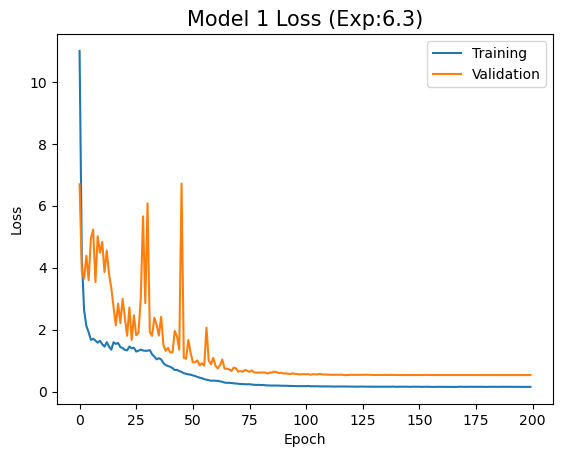

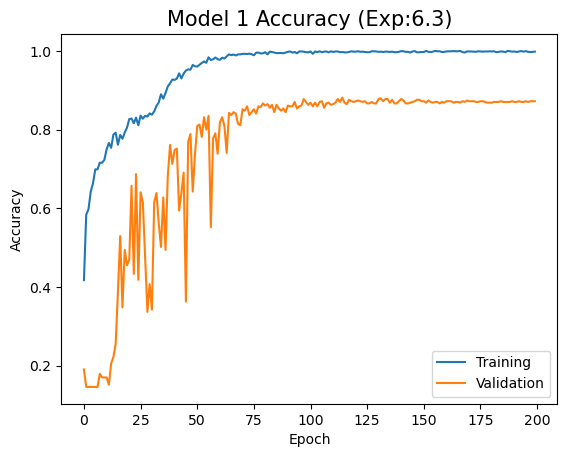

In [25]:
plot_history(history1, 'Model 1 Loss (Exp:6.3)', 'Model 1 Accuracy (Exp:6.3)')

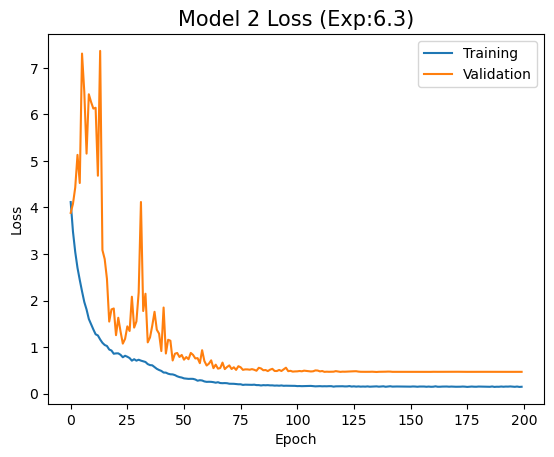

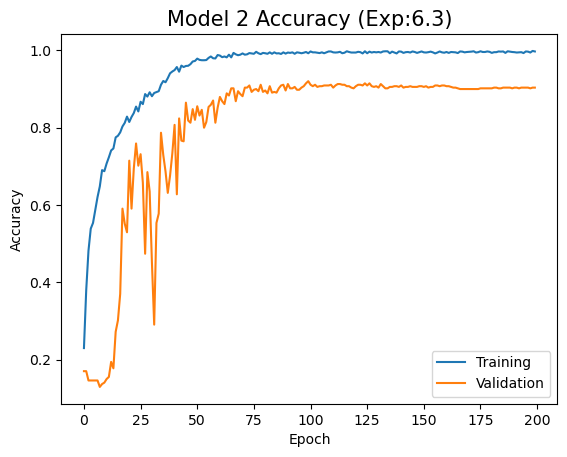

In [26]:
plot_history(history2, 'Model 2 Loss (Exp:6.3)', 'Model 2 Accuracy (Exp:6.3)')

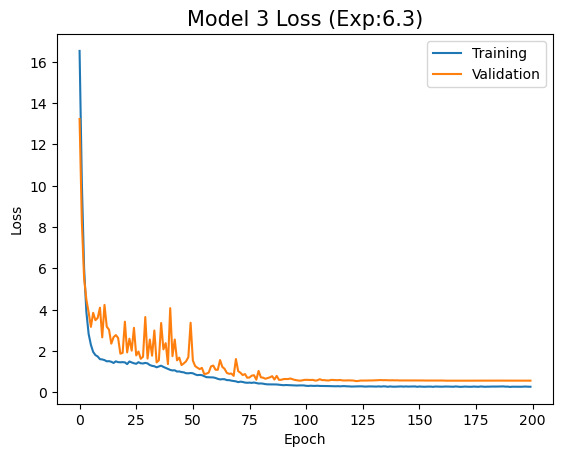

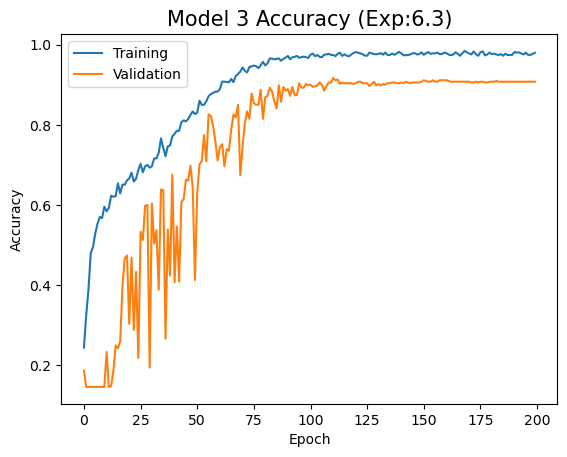

In [27]:
plot_history(history3, 'Model 3 Loss (Exp:6.3)', 'Model 3 Accuracy (Exp:6.3)')

## Evaluate the model for test images

In [28]:
# Evaluate the test result for model 1, 2, 3
model_1.load_weights(checkpoint_filepath6)
Test_result1 = model_1.evaluate(test_images, test_labels, batch_size = 64)

model_2.load_weights(checkpoint_filepath7)
Test_result2 = model_2.evaluate(test_images, test_labels, batch_size = 64)

model_3.load_weights(checkpoint_filepath8)
Test_result3 = model_3.evaluate(test_images, test_labels, batch_size = 64)


5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8248 - loss: 0.5622
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.9065 - loss: 0.4542
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8822 - loss: 0.6519


## Confusion matrix for model 1 to 3

In [29]:
# Model 1 confusion matrix
predictions1 = model_1.predict(test_images)     # Vector of probabilities
pred_label1 = np.argmax(predictions1, axis = 1) # We take the highest probability

# Model 2 confusion matrix
predictions2 = model_2.predict(test_images)     # Vector of probabilities
pred_label2 = np.argmax(predictions2, axis = 1) # We take the highest probability

# Model 3 confusion matrix
predictions3 = model_3.predict(test_images)     # Vector of probabilities
pred_label3 = np.argmax(predictions3, axis = 1) # We take the highest probability

def C_Matrix(test_label, pred_label, CM_Title):
    """
    Display the confusion matrix
    
    Parameter
    arg1 : Test label
    arg2 : Predicted label
    arg3 : Confusion Matrix Title
        
    Return: Display the Confusion matrix for actual and predicted label  
    """
    CM = confusion_matrix(test_label, pred_label)
    ax = plt.axes()
    sns.heatmap(CM, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels=waste_class_names, 
           yticklabels=waste_class_names, ax = ax)
    ax.set_title(CM_Title)
    plt.show()

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step


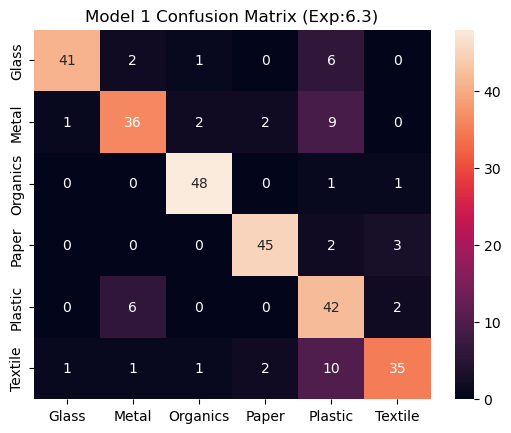

In [30]:
C_Matrix(test_labels, pred_label1, 'Model 1 Confusion Matrix (Exp:6.3)')

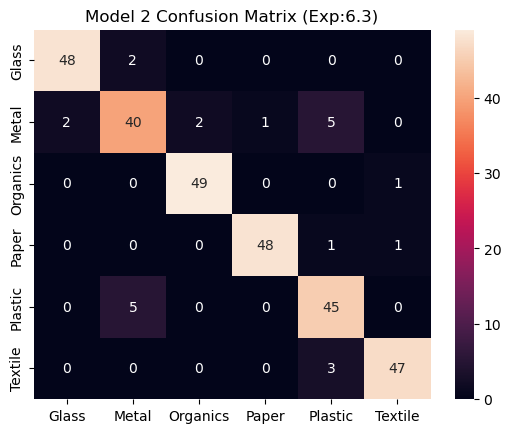

In [31]:
C_Matrix(test_labels, pred_label2, 'Model 2 Confusion Matrix (Exp:6.3)')

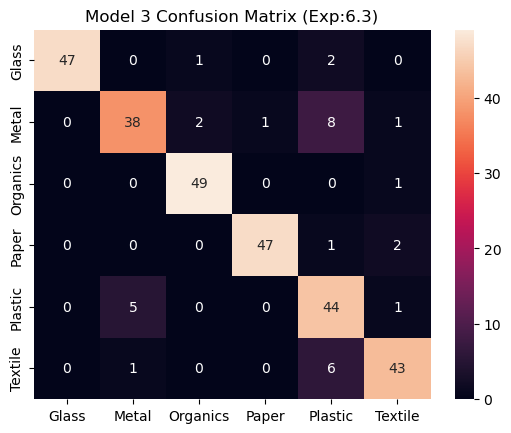

In [32]:
C_Matrix(test_labels, pred_label3, 'Model 3 Confusion Matrix (Exp:6.3)')

## Display 25 images for each model with actual and predicted label

25 random image with actual and predicted label for Model 1


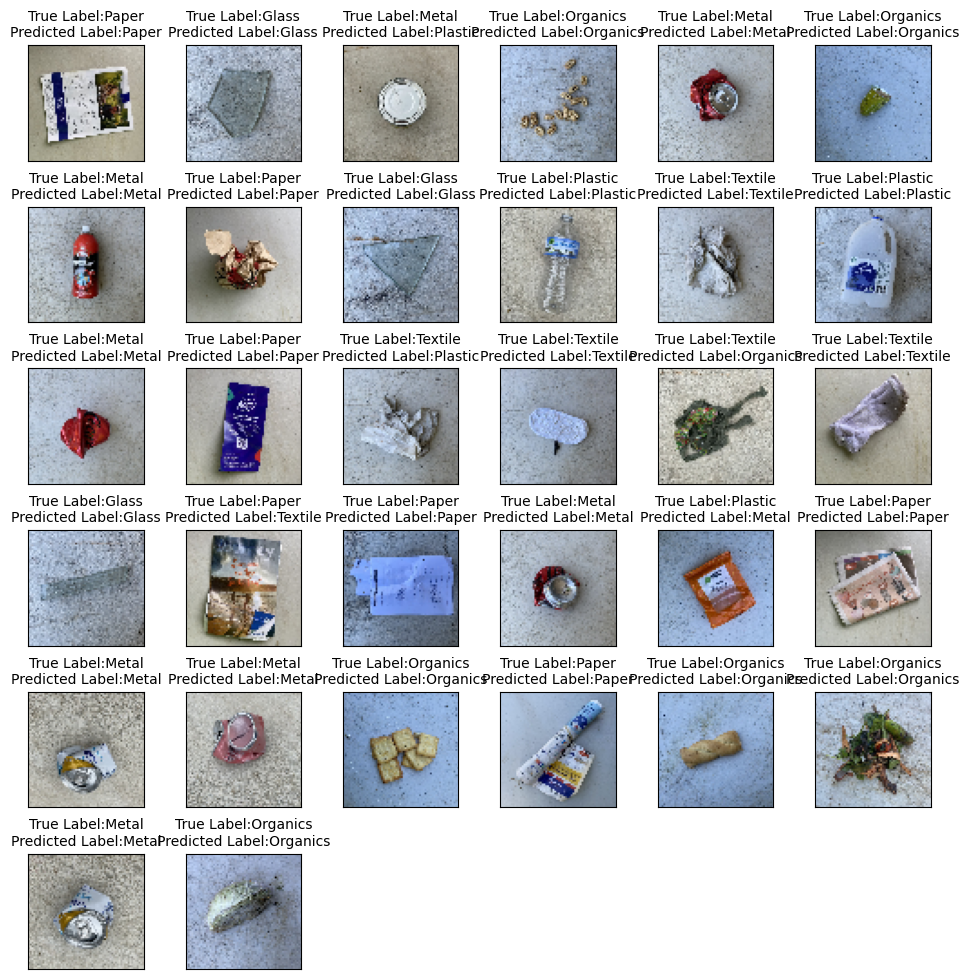

In [72]:
#Display actual and predicted labels for 25 images model 1
print('25 random image with actual and predicted label for Model 1')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(32):
    plt.subplot(6,6, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + waste_class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + waste_class_names[pred_label1[i]], fontsize = 10)
 

25 random image with actual and predicted label for Model 2


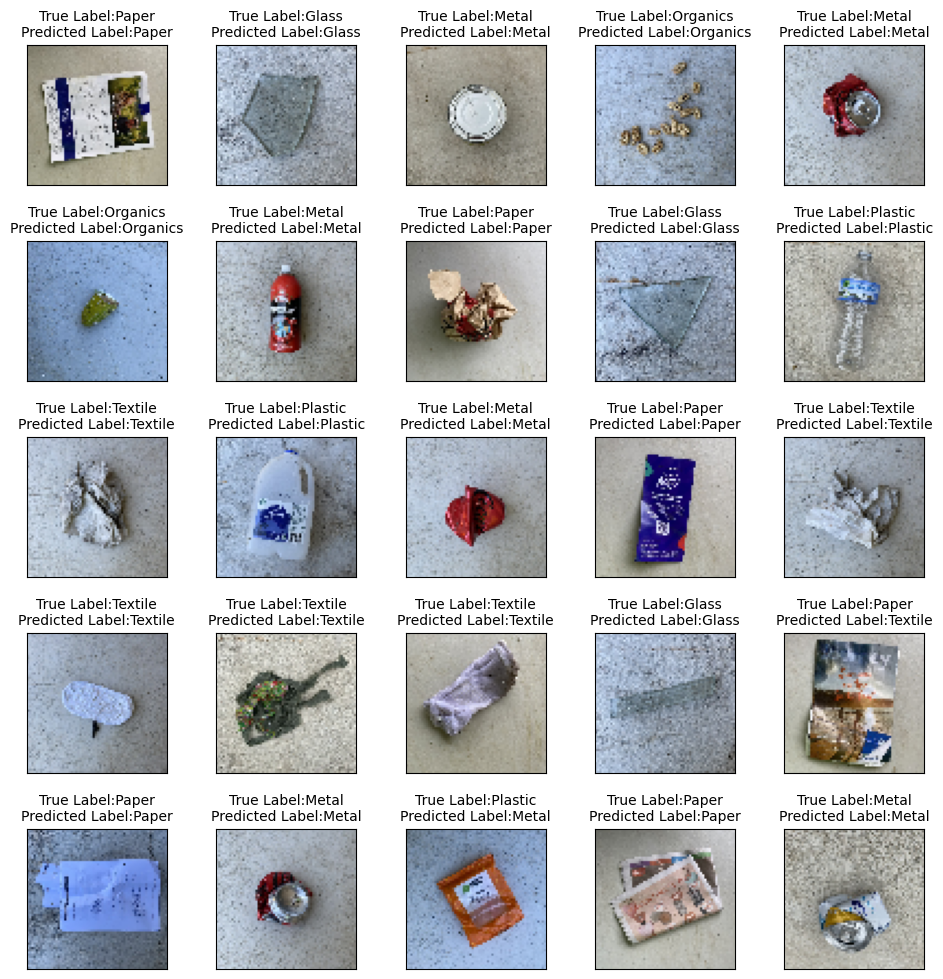

In [34]:
#Display actual and predicted labels for 25 images for model 2
print('25 random image with actual and predicted label for Model 2')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + waste_class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + waste_class_names[pred_label2[i]], fontsize = 10)
    

25 random image with actual and predicted label for Model 3


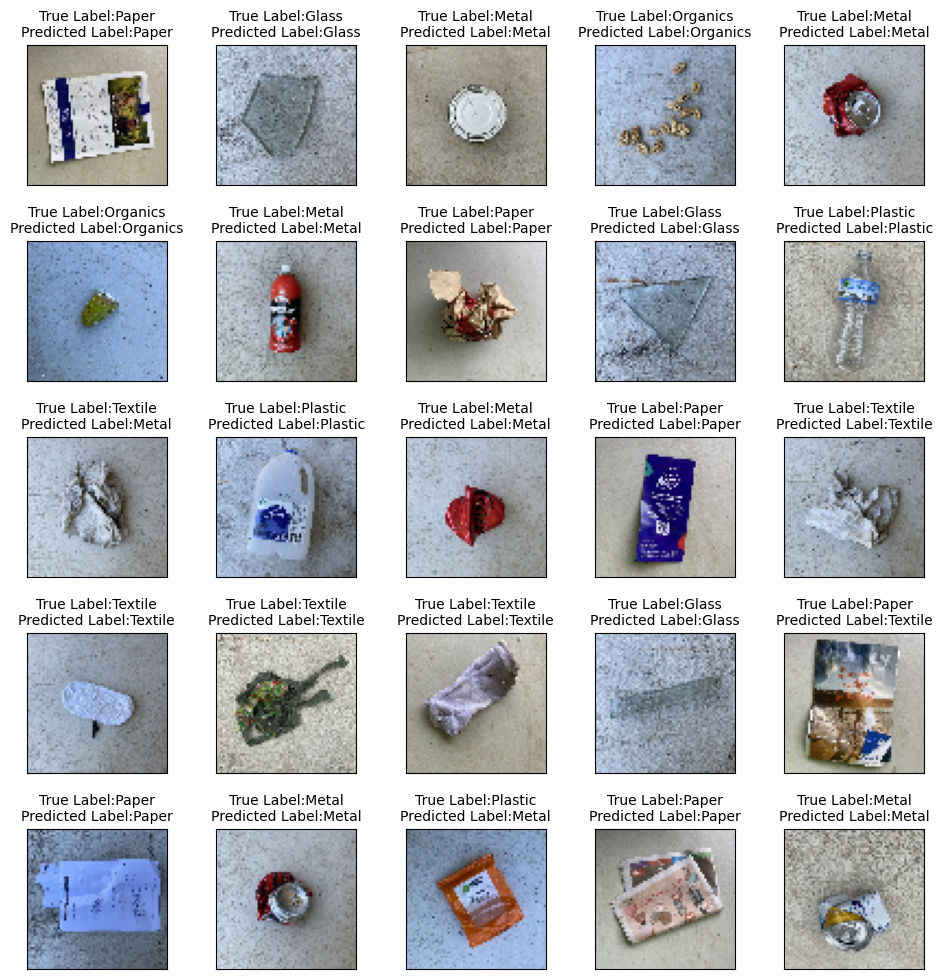

In [35]:
#Display actual and predicted labels for 25 images for model 3
print('25 random image with actual and predicted label for Model 3')
fig = plt.figure(figsize=(12,12))
fig.subplots_adjust(hspace = 0.4, wspace = 0.1)

for i in range(25):
    plt.subplot(5,5, i+1)
    plt.xticks([])
    plt.yticks([])
    #plt.grid(False)
    plt.imshow(test_images[i])
    plt.title("True Label:" + waste_class_names[test_labels[i]] +"\n"+"Predicted Label:"
              + waste_class_names[pred_label3[i]], fontsize = 10)
    

## Display the misclassied image for model 1 to 3

In [70]:
def display_mislabel_images(class_names, waste_images, labels):
    """
    Display the misclassified images and labels
    
    Parameter
    arg1 : waste class names
    arg2 : images
    arg3 : labels
        
    Return: Display the number of misclassified images with labels   
    """
    fig = plt.figure(figsize=(15,15))
    #fig.suptitle("mislabeled images", fontsize=16)
    for i in range(23):
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(waste_images[i], cmap=plt.cm.binary)
        plt.xlabel(waste_class_names[labels[i]], fontsize = 15) 
    plt.show()
    
def print_mislabeled_images(waste_class_names, test_images, test_labels, pred_labels):
    
    """
    Extract the misclassified images and labels
    
    Parameter
    arg1 : waste_class_names
    arg2 : test_images
    arg3 : test_labels
    arg4 : pred_labels
        
    Return: Display the number of misclassified images with label 
    """
    correct_label = (test_labels == pred_labels)
    mislabeled_indices = np.where(correct_label == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
         
    display_mislabel_images(waste_class_names,  mislabeled_images, mislabeled_labels)   


Mislabel image for model 1


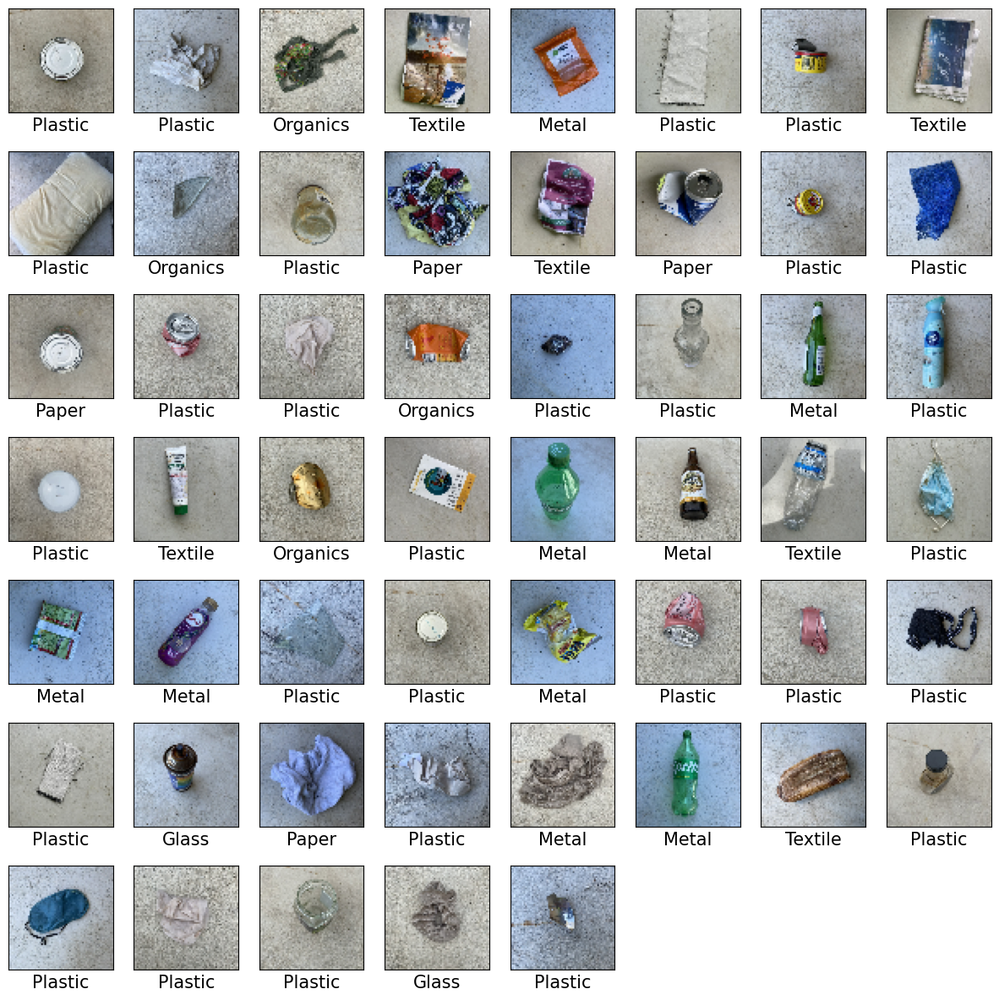

In [69]:
print('Mislabel image for model 1')
print_mislabeled_images(waste_class_names, test_images, test_labels, pred_label1)

Mislabel image for model 2


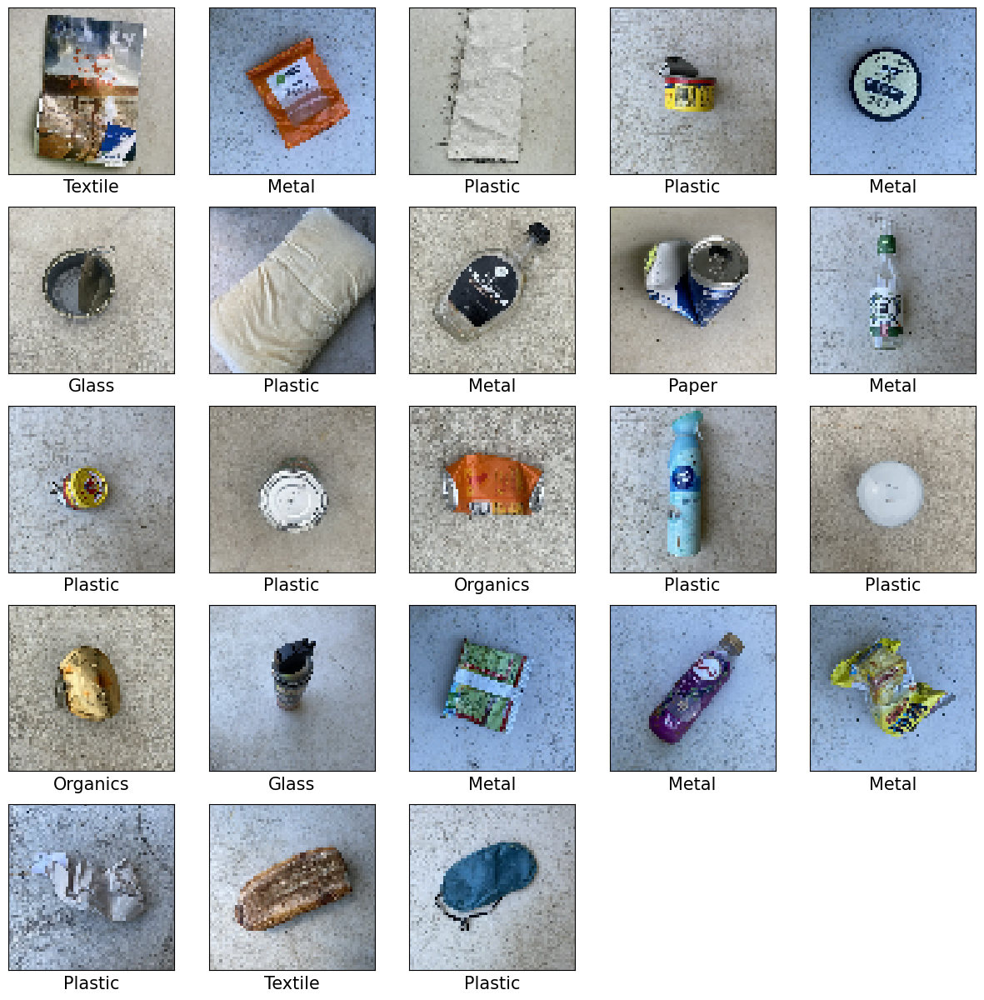

In [71]:
print('Mislabel image for model 2')
print_mislabeled_images(waste_class_names, test_images, test_labels, pred_label2)

Mislabel image for model 3


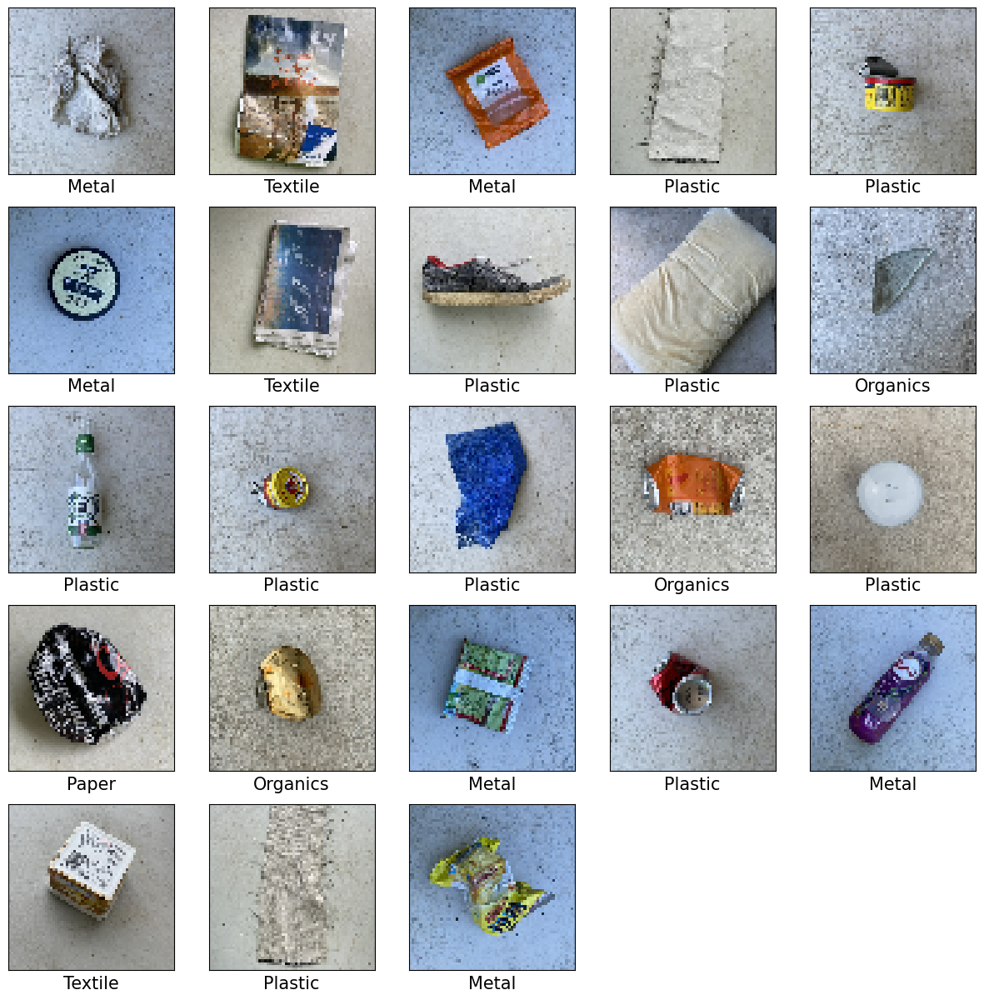

In [73]:
print('Mislabel image for model 3')
print_mislabeled_images(waste_class_names, test_images, test_labels, pred_label3)

## Predict a single image

In [40]:
IMAGE_SIZE = (64,64)
test_imageP = cv.imread("C:/test_ds/Organics/Food Organics_2.jpg")
                        
def predict(model):
    start_time = datetime.now()
    
    test_image1 = test_imageP
    #test_image1 = test_image1 / 255.0
    test_image1 = cv.cvtColor(test_image1, cv.COLOR_BGR2RGB)
    test_image1 = cv.resize(test_image1, IMAGE_SIZE) 
    im1= tf.constant(test_image1, dtype = tf.float32)
    im1= tf.expand_dims(im1,axis = 0)
    im1 = im1 / 255.0
    plt.title('predicted label: ' + waste_class_names[np.argmax(model(im1))])
    plt.imshow(test_image1)
    plt.grid(False)
    plt.axis('off')
    plt.show()

    end_time = datetime.now()
    #print('Predict end:', end_time)
    print('Prediction time:', end_time - start_time)
    


Model 1 Prediction


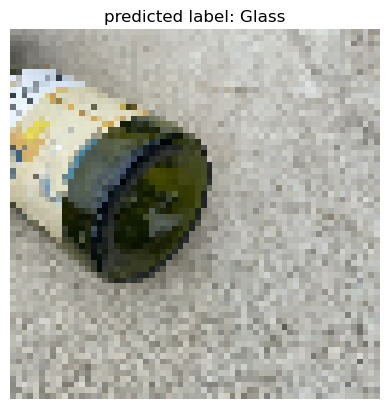

Prediction time: 0:00:00.109226


In [41]:
test_imageP = cv.imread("C:/test_ds/Glass/Glass_2.jpg")
print("Model 1 Prediction")
predict(model_1)

Model 2 Prediction


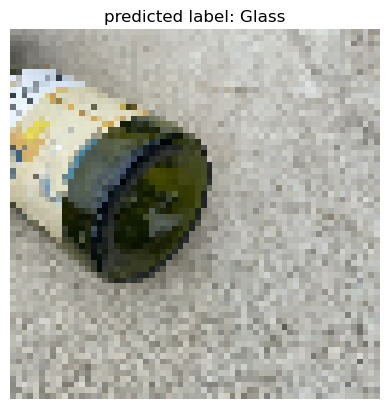

Prediction time: 0:00:00.107302


In [42]:
test_imageP = cv.imread("C:/test_ds/Glass/Glass_2.jpg")
print("Model 2 Prediction")
predict(model_2)

Model 3 prediction


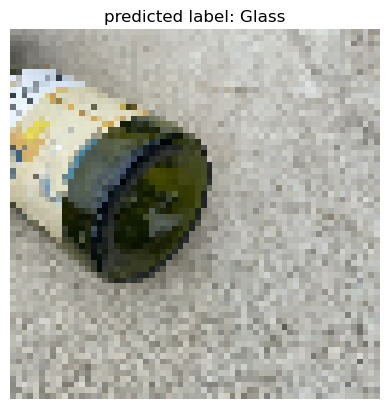

Prediction time: 0:00:00.113806


In [43]:
test_imageP = cv.imread("C:/test_ds/Glass/Glass_2.jpg")
print("Model 3 prediction")
predict(model_3)

## Pre-Training model - Transfer Learning

In [44]:
# Define the class label and image size
waste_class_names = ['Glass', 'Metal', 'Organics', 'Paper', 'Plastic', 'Textile']
waste_class_label = {waste_class_name: i for i, waste_class_name in enumerate(waste_class_names)}
number_of_class = len(waste_class_names)
image_size = (224, 224)

In [45]:
#Prepare dataset for training and testing for Pre-train Model
(train_images1, train_labels1), (test_images1, test_labels1) = load_waste_data(train_ds_3, test_ds_3)

Loading waste image C:/Mani/Dataset/dataset3/train_ds


100%|███████████████████████████████████████████████████████████████████████████████| 450/450 [00:02<00:00, 207.35it/s]


Loading waste image C:/Mani/Dataset/dataset3/test_ds


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 183.92it/s]


In [46]:
# Shuffle only the training dataset
np.random.seed(321)
train_images1, train_labels1 = shuffle(train_images1, train_labels1)
test_images1, test_labels1 = shuffle(test_images1, test_labels1)

In [47]:
#Check the training and testing image shape - should 224 by 224 for Resnet50
train_images1.shape, test_images1.shape

((2700, 224, 224, 3), (300, 224, 224, 3))

In [48]:
# Add callbacks to save the model weight with best accuracy during training
# import ModelCheckpoint package
# from tensorflow.keras.callbacks import ModelCheckpoint
# Source: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint

checkpoint_filepath9 = 'C:/Mani/ModelCheckpoint/model4_6.keras'
model_checkpoint_callback9 = ModelCheckpoint(
    filepath=checkpoint_filepath9,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)


checkpoint_filepath10 = 'C:/Mani/ModelCheckpoint/model5_6.keras'
model_checkpoint_callback10 = ModelCheckpoint(
    filepath=checkpoint_filepath10,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True,
    verbose=1
)


## Pre-Trained Model - EfficientNetV2L

In [49]:
#EfficientNet pre-trained model
base_model = tf.keras.applications.EfficientNetV2L(
    include_top=False,
    weights='imagenet',
    input_shape=((224,224,3)),
    )

base_model.trainable = False

# Build EfficientNetV2 model for waste classification

model_EfficientNetV2 = tf.keras.Sequential([
    tf.keras.layers.Input((224,224,3)),
    base_model,
    tf.keras.layers.Conv2D(32, (3,3),padding='same', kernel_regularizer=regularizers.l2(0.05), activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2)),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Flatten(),
    #tf.keras.layers.Dense(1024, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    #tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(6, activation='softmax')      
])

model_EfficientNetV2.summary()    



Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetv2-l (Functional)        │ (None, 7, 7, 1280)          │     117,746,848 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 7, 7, 32)            │         368,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 3, 3, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 3, 3, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 288)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 128)                 │          36,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 118,153,286 (450.72 MB)

 Trainable params: 406,438 (1.55 MB)

 Non-trainable params: 117,746,848 (449.17 MB)

In [50]:
#Compile Efficientnet model

base_learning_rate = 0.0003
model_EfficientNetV2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])


## Fit EfficientNet 

In [51]:
E_epochs = 40
# Get the current time
start_time = datetime.now()

history4 = model_EfficientNetV2.fit(train_images1, train_labels1,
                       batch_size=batch_size, epochs= E_epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[model_checkpoint_callback9
                                 ])

# Get the current time
end_time = datetime.now()
print('EfficientNetV2_training_time', end_time - start_time )

Epoch 1/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.3869 - loss: 104.2719 
Epoch 1: val_accuracy improved from -inf to 0.82222, saving model to C:/Mani/ModelCheckpoint/model4_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 558s 15s/step - accuracy: 0.3913 - loss: 104.0901 - val_accuracy: 0.8222 - val_loss: 84.8911
Epoch 2/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.7774 - loss: 79.9026 
Epoch 2: val_accuracy improved from 0.82222 to 0.86481, saving model to C:/Mani/ModelCheckpoint/model4_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 490s 15s/step - accuracy: 0.7774 - loss: 79.7652 - val_accuracy: 0.8648 - val_loss: 65.0842
Epoch 3/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.8508 - loss: 61.1213 
Epoch 3: val_accuracy improved from 0.86481 to 0.88333, saving model to C:/Mani/ModelCheckpoint/model4_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 489s 14s/step - accuracy: 0.8508 - loss: 61.0143 - val_accuracy: 0.8833 - val_loss: 49.5853
Epoch 4/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - a

34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9374 - loss: 0.5053 
Epoch 25: val_accuracy did not improve from 0.91111
34/34 ━━━━━━━━━━━━━━━━━━━━ 477s 14s/step - accuracy: 0.9373 - loss: 0.5055 - val_accuracy: 0.8741 - val_loss: 0.6407
Epoch 26/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9215 - loss: 0.5206 
Epoch 26: val_accuracy did not improve from 0.91111
34/34 ━━━━━━━━━━━━━━━━━━━━ 478s 14s/step - accuracy: 0.9215 - loss: 0.5207 - val_accuracy: 0.8981 - val_loss: 0.5811
Epoch 27/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9423 - loss: 0.4713 
Epoch 27: val_accuracy did not improve from 0.91111
34/34 ━━━━━━━━━━━━━━━━━━━━ 480s 14s/step - accuracy: 0.9421 - loss: 0.4718 - val_accuracy: 0.8870 - val_loss: 0.5852
Epoch 28/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.9410 - loss: 0.4685 
Epoch 28: val_accuracy did not improve from 0.91111
34/34 ━━━━━━━━━━━━━━━━━━━━ 481s 14s/step - accuracy: 0.9409 - loss: 0.4689 - val_accuracy: 0.9000 - val_loss:

## Accuracy plot and loss plot for EfficientNet

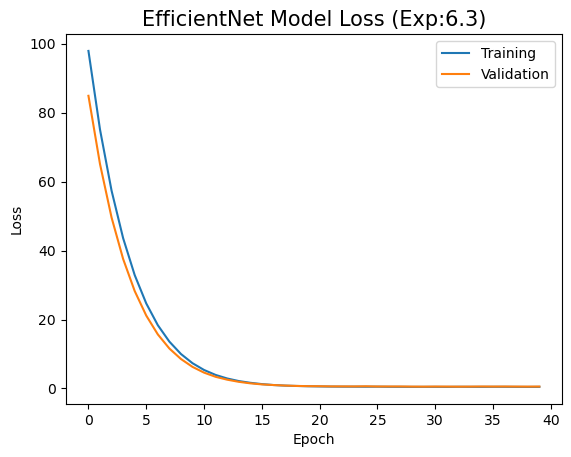

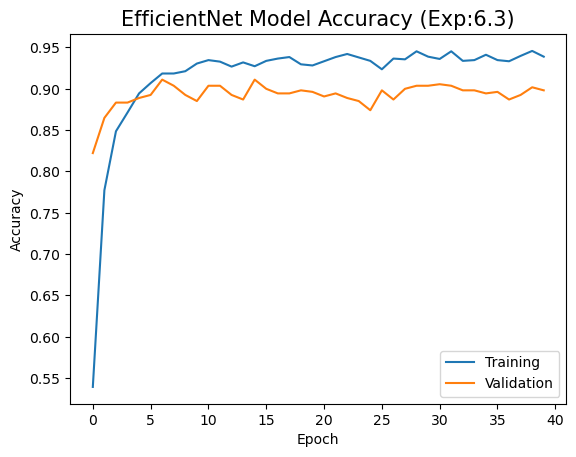

In [52]:
plot_history(history4, 'EfficientNet Model Loss (Exp:6.3)', 'EfficientNet Model Accuracy (Exp:6.3)')

In [53]:
#Load the best model1 weight from checkpoint
# Evaluate the test result EfficientNet

model_EfficientNetV2.load_weights(checkpoint_filepath9)
Test_result4 = model_EfficientNetV2.evaluate(test_images1, test_labels1, batch_size = 64)

5/5 ━━━━━━━━━━━━━━━━━━━━ 53s 10s/step - accuracy: 0.8993 - loss: 15.6879


In [54]:
# Reference tf.keras.applications.EffificentNetV2L - tensorflow > API > Tensorflow v2.16.1 > Python
#Obtain the model's prediction for the test_images
prediction4 = model_EfficientNetV2.predict(test_images1)
pred_label4 = np.argmax(prediction4, axis = 1)

10/10 ━━━━━━━━━━━━━━━━━━━━ 77s 7s/step


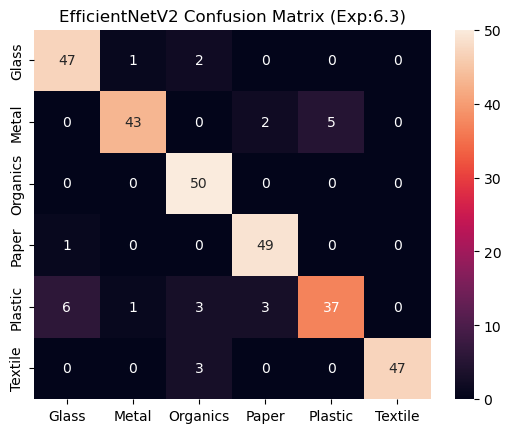

In [55]:
C_Matrix(test_labels, pred_label4, 'EfficientNetV2 Confusion Matrix (Exp:6.3)')

## Pre-Train model - MobileNetV3Large

In [56]:
#base_model_MobileNetV3Large

base_model_MobileNetV3 = tf.keras.applications.MobileNetV3Large(
    include_top=False,
    weights='imagenet',
    input_shape=((224,224,3)),
    )

base_model_MobileNetV3.trainable = False

# Build MobileNetV3 model for waste classification

model_MobileNetV3 = tf.keras.Sequential([
    tf.keras.layers.Input((224,224,3)),
    base_model_MobileNetV3,
    tf.keras.layers.Conv2D(128, (3,3),padding='same', kernel_regularizer=regularizers.l2(0.06), activation='relu'),
    tf.keras.layers.MaxPooling2D((2,2)),
    #tf.keras.layer.GlobalMaxPool2D((2,2))
    tf.keras.layers.Dropout(0.4),
    
    tf.keras.layers.Flatten(),
    #tf.keras.layers.Dense(1024, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.Dense(128, kernel_regularizer=regularizers.l2(0.6), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(6, activation='softmax')      
])

model_MobileNetV3.summary()  

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobilenetV3large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 7, 7, 128)           │       1,106,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_16 (Dropout)                 │ (None, 3, 3, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 128)                 │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_17 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,251,270 (16.22 MB)

 Trainable params: 1,254,662 (4.79 MB)

 Non-trainable params: 2,996,608 (11.43 MB)

In [57]:
#Compile and fit MobileNet model

Mobile_learning_rate = 0.0002
M_epochs = 40

model_MobileNetV3.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = Mobile_learning_rate),
                loss = 'sparse_categorical_crossentropy',
                metrics=['accuracy'])

# Get the current time
start_time = datetime.now()

history5 = model_MobileNetV3.fit(train_images1, train_labels1,
                       batch_size=batch_size, epochs= M_epochs, 
                       validation_split = 0.2, verbose=1,
                       callbacks=[model_checkpoint_callback10])

# Get the current time
end_time = datetime.now()
print('MobileNetV3_training_time', end_time - start_time )

Epoch 1/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.3265 - loss: 144.3748
Epoch 1: val_accuracy improved from -inf to 0.72778, saving model to C:/Mani/ModelCheckpoint/model5_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 59s 1s/step - accuracy: 0.3297 - loss: 144.1152 - val_accuracy: 0.7278 - val_loss: 116.5240
Epoch 2/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 968ms/step - accuracy: 0.6898 - loss: 109.1796
Epoch 2: val_accuracy improved from 0.72778 to 0.83889, saving model to C:/Mani/ModelCheckpoint/model5_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 42s 1s/step - accuracy: 0.6905 - loss: 108.9789 - val_accuracy: 0.8389 - val_loss: 87.5593
Epoch 3/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 942ms/step - accuracy: 0.8101 - loss: 81.8752
Epoch 3: val_accuracy improved from 0.83889 to 0.87222, saving model to C:/Mani/ModelCheckpoint/model5_6.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.8102 - loss: 81.7202 - val_accuracy: 0.8722 - val_loss: 65.3148
Epoch 4/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 934ms/step - ac

Epoch 25/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 967ms/step - accuracy: 0.9831 - loss: 0.6277
Epoch 25: val_accuracy did not improve from 0.93519
34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9831 - loss: 0.6274 - val_accuracy: 0.9056 - val_loss: 0.8050
Epoch 26/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 978ms/step - accuracy: 0.9871 - loss: 0.5687
Epoch 26: val_accuracy did not improve from 0.93519
34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9871 - loss: 0.5686 - val_accuracy: 0.9315 - val_loss: 0.7193
Epoch 27/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 960ms/step - accuracy: 0.9887 - loss: 0.5275
Epoch 27: val_accuracy did not improve from 0.93519
34/34 ━━━━━━━━━━━━━━━━━━━━ 40s 1s/step - accuracy: 0.9886 - loss: 0.5276 - val_accuracy: 0.9074 - val_loss: 0.7712
Epoch 28/40
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 967ms/step - accuracy: 0.9710 - loss: 0.5904
Epoch 28: val_accuracy did not improve from 0.93519
34/34 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9709 - loss: 0.5911 - val_accuracy: 0.9333 - v

## Accuracy plot and loss plot for MobileNetV3

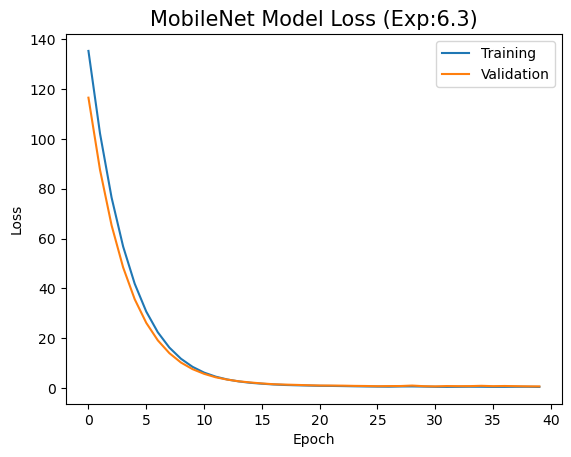

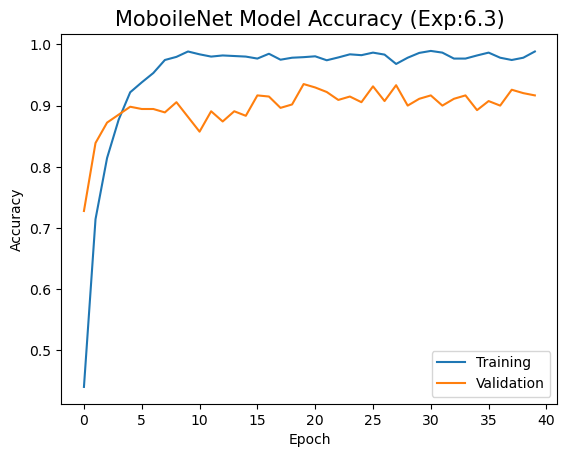

In [58]:
plot_history(history5, 'MobileNet Model Loss (Exp:6.3)', 'MoboileNet Model Accuracy (Exp:6.3)')

In [59]:
#Load the best mobileNetV3 weight from checkpoint_filepath5
model_MobileNetV3.load_weights(checkpoint_filepath10)
MobileNetV3_result = model_MobileNetV3.evaluate(test_images1, test_labels1)

print('MobileNetV3 accuracy:', MobileNetV3_result)

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 460ms/step - accuracy: 0.8914 - loss: 1.1954
MobileNetV3 accuracy: [1.164164662361145, 0.9100000262260437]


In [60]:
# Reference tf.keras.applications.EffificentNetV2L - tensorflow > API > Tensorflow v2.16.1 > Python
#Obtain the model's prediction for the test_images
prediction5 = model_MobileNetV3.predict(test_images1)
pred_label5 = np.argmax(prediction5, axis = 1)

10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 594ms/step


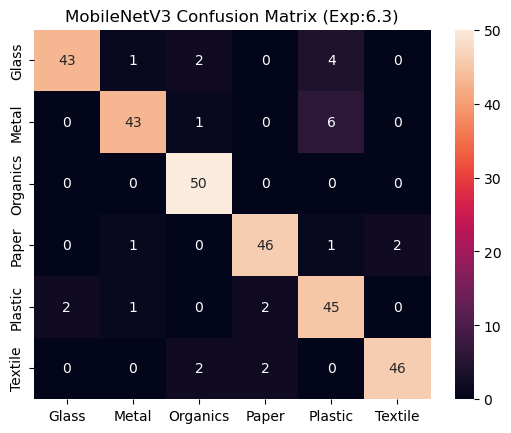

In [61]:
C_Matrix(test_labels, pred_label5, 'MobileNetV3 Confusion Matrix (Exp:6.3)')

## Display Misclassified Images

In [76]:
def display_mislabel_images(waste_class_names, images, labels):
    """
    Display the misclassified images and labels
    
    Parameter
    arg1 : waste class names
    arg2 : images
    arg3 : labels
        
    Return: Display the number of misclassified images with labels   
    """
    fig = plt.figure(figsize=(10,10))
    fig.suptitle("mislabeled images", fontsize=16)
    for i in range(27):
        plt.subplot(5,6,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(images[i] /255.0, cmap=plt.cm.binary)
        plt.xlabel(waste_class_names[labels[i]], fontsize = 15)
        
plt.show()

def print_mislabeled_images(class_names, test_images, test_labels, pred_labels):
    """
    Extract the misclassified images and labels
    
    Parameter
    arg1 : waste_class_names
    arg2 : test_images
    arg3 : test_labels
    arg4 : pred_labels
        
    Return: Display the number of misclassified images with label 
    """
    correct_label = (test_labels == pred_labels)
    mislabeled_indices = np.where(correct_label == 0)
    mislabeled_images = test_images[mislabeled_indices]
    mislabeled_labels = pred_labels[mislabeled_indices]
    actual_label = test_labels[mislabeled_indices]

      
    display_mislabel_images(waste_class_names,  mislabeled_images, mislabeled_labels)


EfficientNetV2


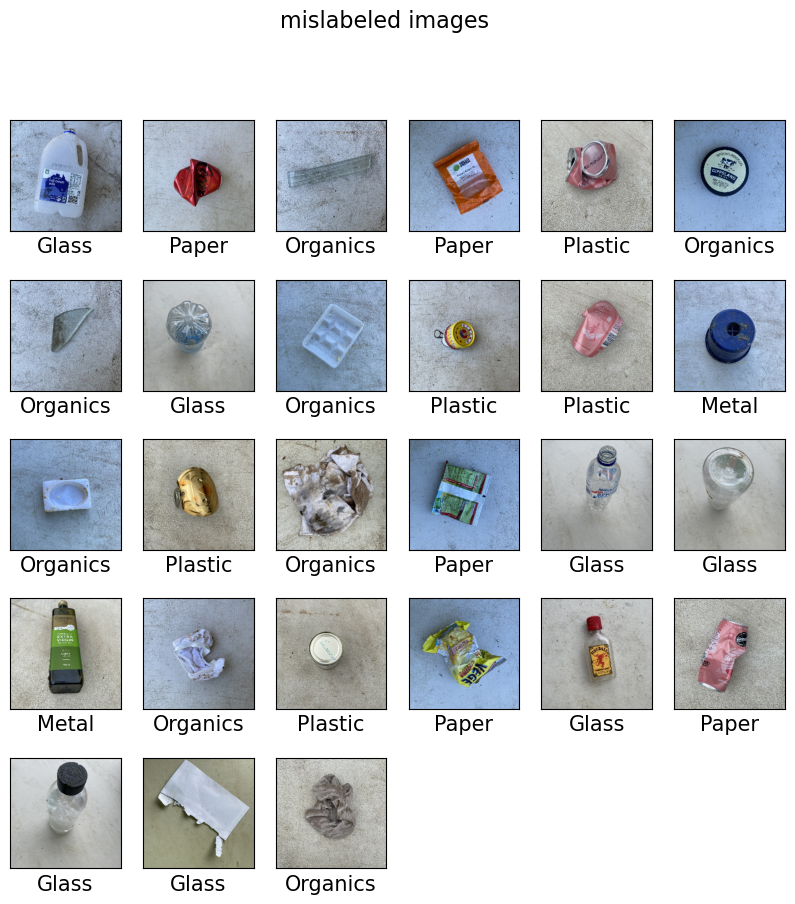

In [77]:
print('EfficientNetV2')
print_mislabeled_images(waste_class_names, test_images1, test_labels1, pred_label4)

MobileNetV3


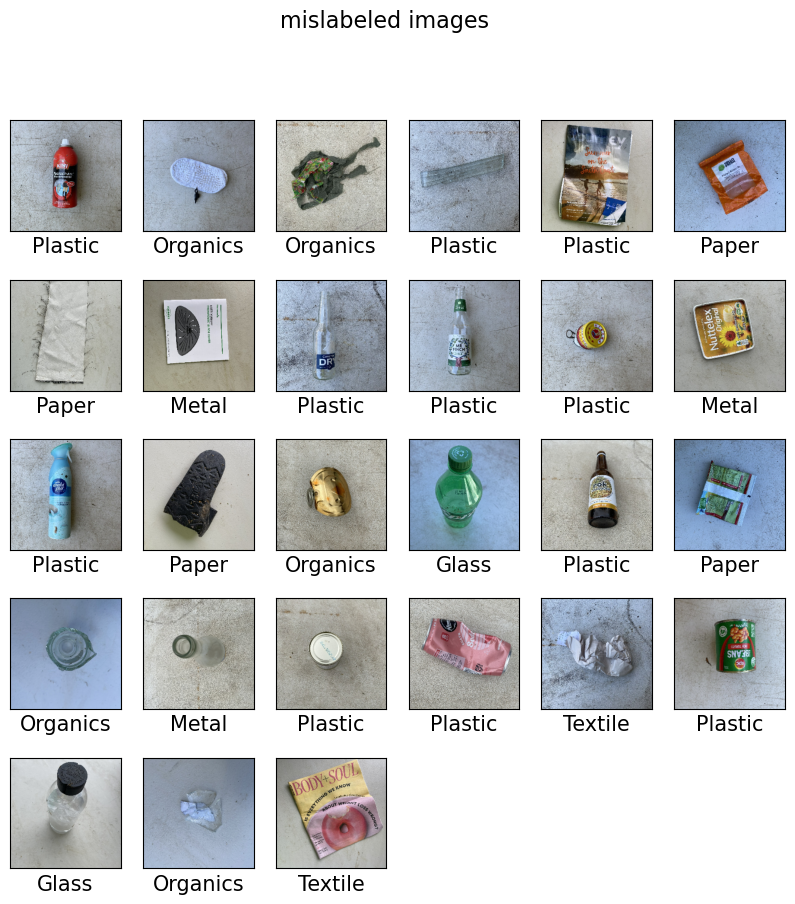

In [78]:
print('MobileNetV3')
print_mislabeled_images(waste_class_names, test_images1, test_labels1, pred_label5)

## Predict Single images for MobileNet and EfficientNet

In [65]:
IMAGE_SIZE = (244,244)
test_imageP = cv.imread("C:/test_ds/Organics/Food Organics_2.jpg")
                        
def predict1(model):
    start_time = datetime.now()
    
    test_image1 = test_imageP
    #test_image1 = test_image1 / 255.0
    test_image1 = cv.cvtColor(test_image1, cv.COLOR_BGR2RGB)
    test_image1 = cv.resize(test_image1, IMAGE_SIZE) 
    im1= tf.constant(test_image1, dtype = tf.float32)
    im1= tf.expand_dims(im1,axis = 0)
    #im1 = im1 / 255.0
    plt.title('predicted label: ' + waste_class_names[np.argmax(model(im1))])
    plt.imshow(test_image1)
    plt.grid(False)
    plt.axis('off')
    plt.show()

    end_time = datetime.now()
    #print('Predict end:', end_time)
    print('Prediction time:', end_time - start_time)
    


MobileNetV3 prediction


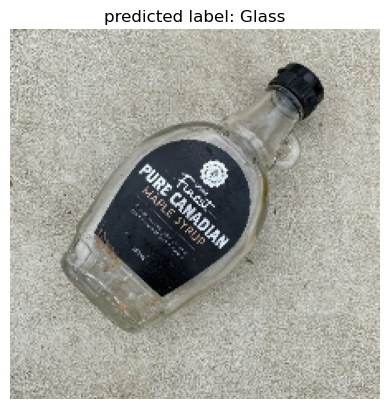

Prediction time: 0:00:00.490545


In [66]:
test_imageP = cv.imread("C:/test_ds/Glass/Glass_6.jpg")
IMAGE_SIZE = (224,224)
print("MobileNetV3 prediction")
predict1(model_MobileNetV3)

EfficientNetV2 prediction


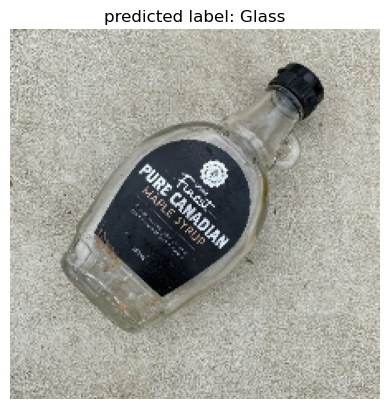

Prediction time: 0:00:02.327224


In [67]:
print("EfficientNetV2 prediction")
predict1(model_EfficientNetV2)